In [1]:
%matplotlib inline
from matplotlib import pyplot as plt, cm
from PIL import Image
from PIL import ImageFilter
from PIL import ImageEnhance
from PIL import ImageChops
from PIL import ImageOps 
import numpy as np
import os
from operator import itemgetter

In [84]:
# 이미지 파일 경로
im1 = "./data/IMG_4139.jpg"
im2 = "./data/IMG_4164.jpg"

In [85]:
# 이미지 파일 로드
img1 = Image.open(im1)
img2 = Image.open(im2)

In [86]:
print "file name is %s" %img1.filename
print " - format is %s" %img1.format
print " - color mode is %s" %img1.mode
print " - dpi is %s" %str(img1.info['dpi'])
print " - size is %s" %str(img1.size)
print 
print 
print "file name is %s" %img2.filename
print " - format is %s" %img2.format
print " - color mode is %s" %img2.mode
print " - dpi is %s" %str(img2.info['dpi'])
print " - size is %s" %str(img2.size)

file name is ./data/IMG_4139.jpg
 - format is JPEG
 - color mode is RGB
 - dpi is (72, 72)
 - size is (3264, 2448)


file name is ./data/IMG_4164.jpg
 - format is JPEG
 - color mode is RGB
 - dpi is (72, 72)
 - size is (3264, 2448)


In [87]:
img1_np = np.asarray(img1)
img2_np = np.asarray(img2)
print "the dimension of %s is %s" %(img1.filename, str(img1_np.shape))
print "the dimension of %s is %s" %(img2.filename, str(img2_np.shape))

the dimension of ./data/IMG_4139.jpg is (2448, 3264, 3)
the dimension of ./data/IMG_4164.jpg is (2448, 3264, 3)


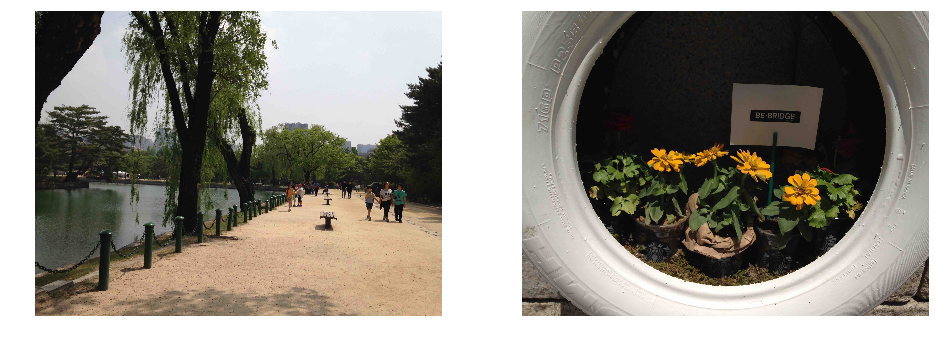

In [88]:
# img1 : <PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=3264x2448 at 0x1058E2DD0>
# img1_np : numpy array 
# 둘 다 plt.imshow로 출력됨

# fig size setting
plt.figure(figsize=(16,12))

plt.subplot(121)
plt.axis('off')
plt.imshow(img1)

plt.subplot(122)
plt.axis('off')
plt.imshow(img2_np)

In [89]:
# Create JPEG thumbnails
outfile = os.path.splitext(img1.filename)[0] + ".thumbnail.jpg"
size = (128, 128)
img1.thumbnail(size)
img1.save(outfile, "JPEG")

In [90]:
# 썸네일이 정상적으로 생성됨
!ls -al ./data/*.thumbnail.jpg

-rw-r--r--@ 1 dikien  staff  3455  5 13 12:52 ./data/IMG_4139.thumbnail.jpg


the original size of ./data/IMG_4139.jpg is (3264, 2448)
the original size of ./data/IMG_4164.jpg is (3264, 2448)
the size of ./data/IMG_4139.jpg is (300, 200) after subrectangle
the size of ./data/IMG_4164.jpg is (300, 200) after subrectangle


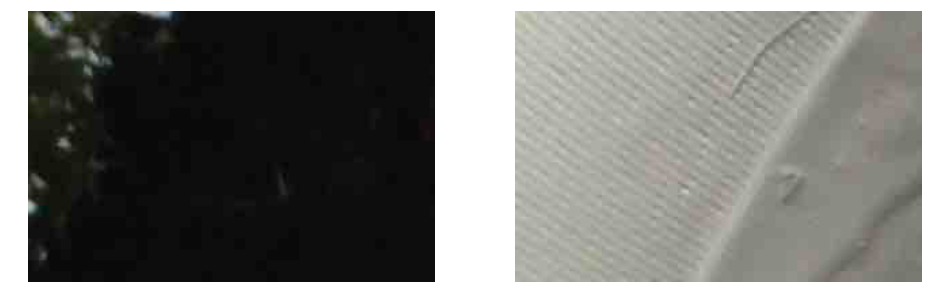

In [91]:
# Copying a subrectangle from an image
# 이미지 파일 로드
img1 = Image.open(im1)
img2 = Image.open(im2)

print "the original size of %s is %s" %(im1, str(img1.size))
print "the original size of %s is %s" %(im2, str(img2.size))

# The region is defined by a 4-tuple, where coordinates are (left, upper, right, lower).
box = (0, 0, 300, 200)
region1 = img1.crop(box)
region2 = img2.crop(box)

print "the size of %s is %s after subrectangle" %(im1, str(region2.size))
print "the size of %s is %s after subrectangle" %(im2, str(region2.size))

plt.figure(figsize=(16,12))

plt.subplot(121)
plt.axis('off')
plt.imshow(region1)

plt.subplot(122)
plt.axis('off')
plt.imshow(region2)

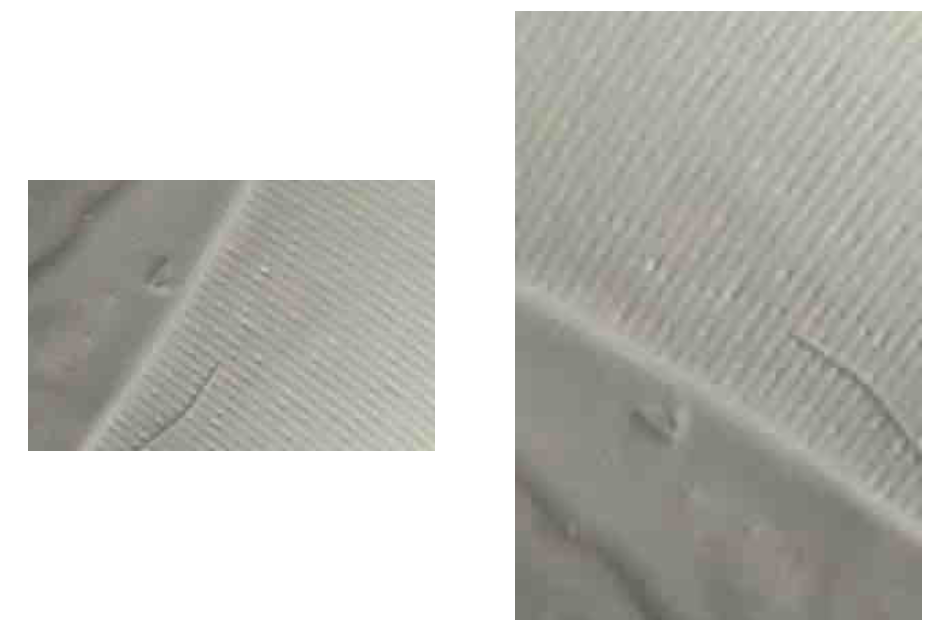

In [92]:
# transpose
# 이미지 파일 로드
img1 = Image.open(im1)
img2 = Image.open(im2)

box = (0, 0, 300, 200)
region = img2.crop(box)
region1 = region.transpose(Image.ROTATE_180)
region2 = region.transpose(Image.ROTATE_270)

# img2.paste(region, img1)
# im.paste(region, img1)

plt.figure(figsize=(16,12))

plt.subplot(121)
plt.axis('off')
plt.imshow(region1)

plt.subplot(122)
plt.axis('off')
plt.imshow(region2)

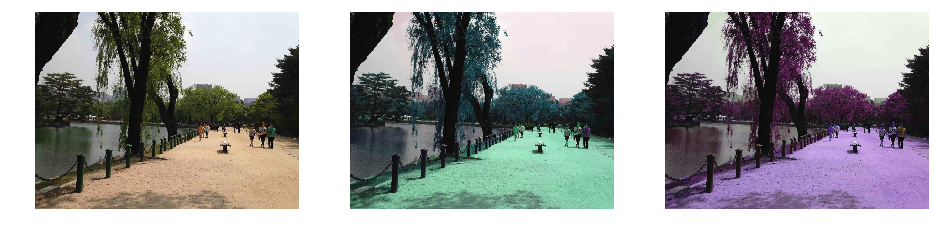

In [93]:
# Splitting and merging bands
im = Image.open(im1)

r, g, b = im.split()
im = Image.merge("RGB", (r, g, b))

plt.figure(figsize=(16,12))

plt.subplot(1,3,1)
plt.axis('off')
plt.imshow(im)

im = Image.merge("RGB", (b, r, g))
plt.subplot(1,3,2)
plt.axis('off')
plt.imshow(im)

im = Image.merge("RGB", (g, b, r))
plt.subplot(1,3,3)
plt.axis('off')
plt.imshow(im)

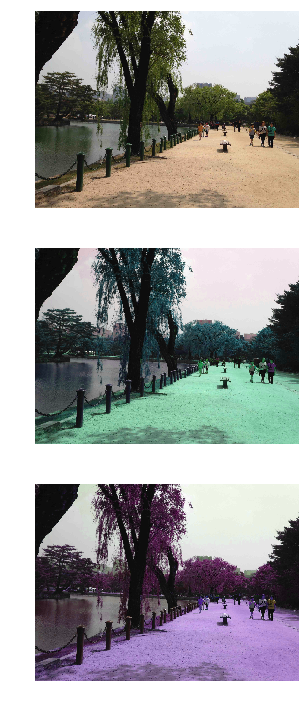

In [94]:
# Splitting and merging bands
im = Image.open(im1)

r, g, b = im.split()
im = Image.merge("RGB", (r, g, b))

plt.figure(figsize=(16,12))

plt.subplot(3,1,1)
plt.axis('off')
plt.imshow(im)

im = Image.merge("RGB", (b, r, g))
plt.subplot(3,1,2)
plt.axis('off')
plt.imshow(im)

im = Image.merge("RGB", (g, b, r))
plt.subplot(3,1,3)
plt.axis('off')
plt.imshow(im)

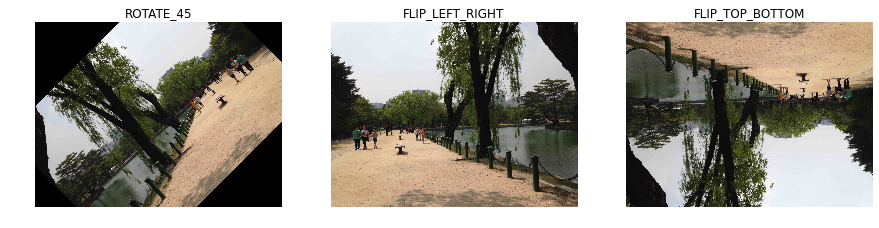

In [130]:
# Geometrical transforms

plt.figure(figsize=(15,12))

im = Image.open(im1)
out = im.rotate(45)
plt.subplot(1,3,1)
plt.axis('off')
plt.title('ROTATE_45')
plt.imshow(out)

out = im.transpose(Image.FLIP_LEFT_RIGHT)
plt.subplot(1,3,2)
plt.axis('off')
plt.title('FLIP_LEFT_RIGHT')
plt.imshow(out)

out = im.transpose(Image.FLIP_TOP_BOTTOM)
plt.subplot(1,3,3)
plt.axis('off')
plt.title('FLIP_TOP_BOTTOM')
plt.imshow(out)

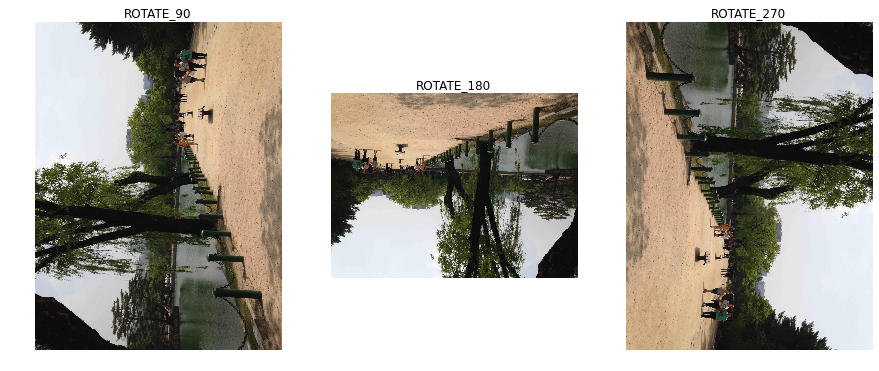

In [129]:
plt.figure(figsize=(15,12))

im = Image.open(im1)
out = im.transpose(Image.ROTATE_90)
plt.subplot(1,3,1)
plt.axis('off')
plt.title('ROTATE_90')
plt.imshow(out)

out = im.transpose(Image.ROTATE_180)
plt.subplot(1,3,2)
plt.axis('off')
plt.title('ROTATE_180')
plt.imshow(out)

out = im.transpose(Image.ROTATE_270)
plt.subplot(1,3,3)
plt.axis('off')
plt.title('ROTATE_270')
plt.imshow(out)

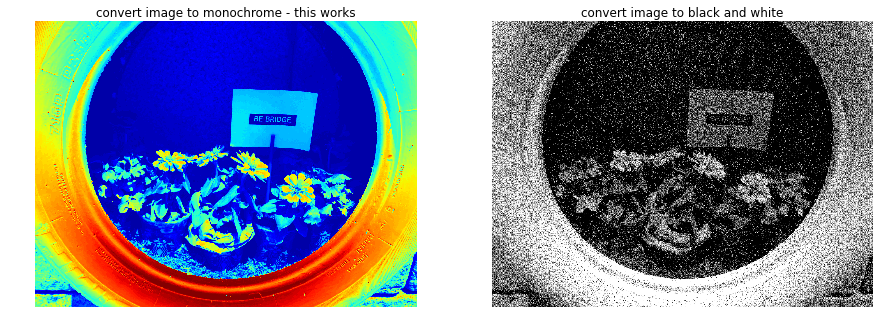

In [128]:
plt.figure(figsize=(15,12))

im = Image.open(im2)
out = im.convert('L') # convert image to monochrome - this works
plt.subplot(1,2,1)
plt.axis('off')
plt.title('convert image to monochrome - this works')
plt.imshow(out)

out = im.convert('1') # convert image to black and white
plt.subplot(1,2,2)
plt.axis('off')
plt.title('convert image to black and white')
plt.imshow(out)

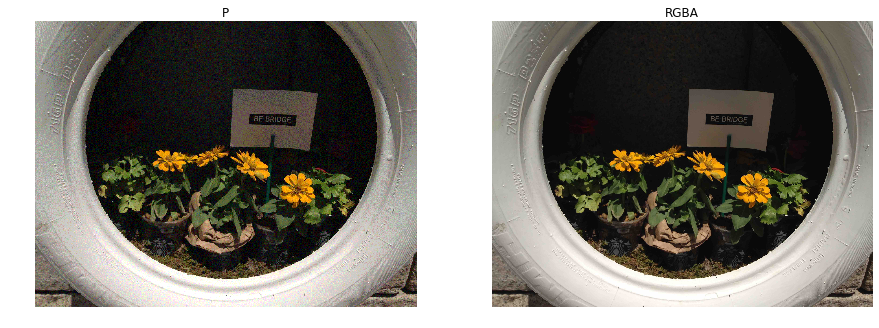

In [144]:
plt.figure(figsize=(15,12))

im = Image.open(im2)
out = im.convert('P') # P (8-bit pixels, mapped to any other mode using a color palette)
plt.subplot(1,2,1)
plt.axis('off')
plt.title('P')
plt.imshow(out)

out = im.convert('RGBA') # RGBA (4x8-bit pixels, true color with transparency mask)
plt.subplot(1,2,2)
plt.axis('off')
plt.title('RGBA')
plt.imshow(out)

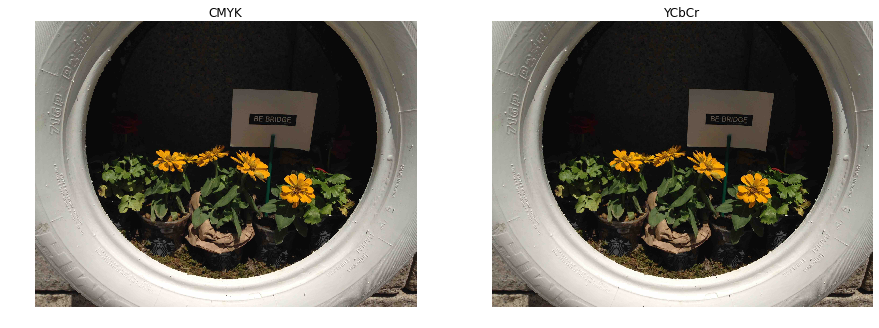

In [145]:
plt.figure(figsize=(15,12))

im = Image.open(im2)
out = im.convert('CMYK') # CMYK (4x8-bit pixels, color separation)
plt.subplot(1,2,1)
plt.axis('off')
plt.title('CMYK')
plt.imshow(out)

out = im.convert("YCbCr") # YCbCr (3x8-bit pixels, color video format)
plt.subplot(1,2,2)
plt.axis('off')
plt.title('YCbCr')
plt.imshow(out)

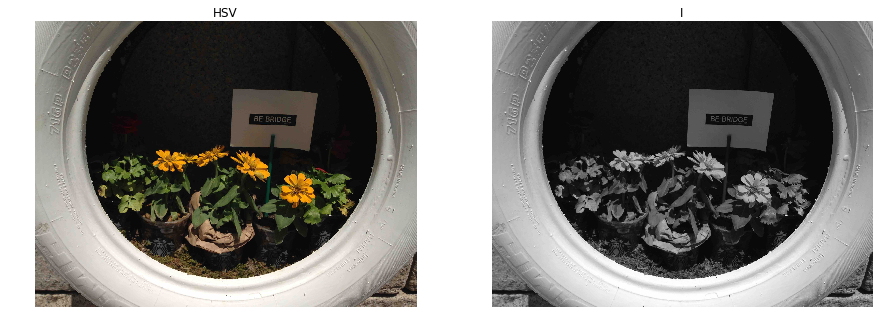

In [146]:
plt.figure(figsize=(15,12))

im = Image.open(im2)
out = im.convert('HSV') # HSV (3x8-bit pixels, Hue, Saturation, Value color space)
plt.subplot(1,2,1)
plt.axis('off')
plt.title('HSV')
plt.imshow(out)

out = im.convert("I") # I (32-bit signed integer pixels)
plt.subplot(1,2,2)
plt.axis('off')
plt.title('I')
plt.imshow(out)

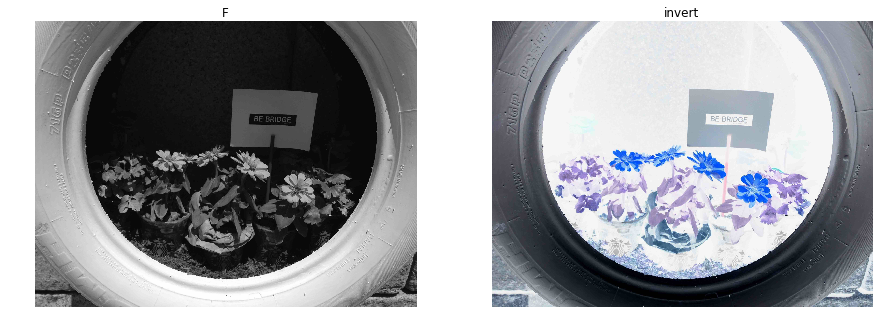

In [150]:
plt.figure(figsize=(15,12))

im = Image.open(im2)
out = im.convert("F") # F (32-bit floating point pixels)
plt.subplot(1,2,1)
plt.axis('off')
plt.title('F')
plt.imshow(out)

out = ImageChops.invert(im)
plt.subplot(1,2,2)
plt.axis('off')
plt.title('invert')
plt.imshow(out)

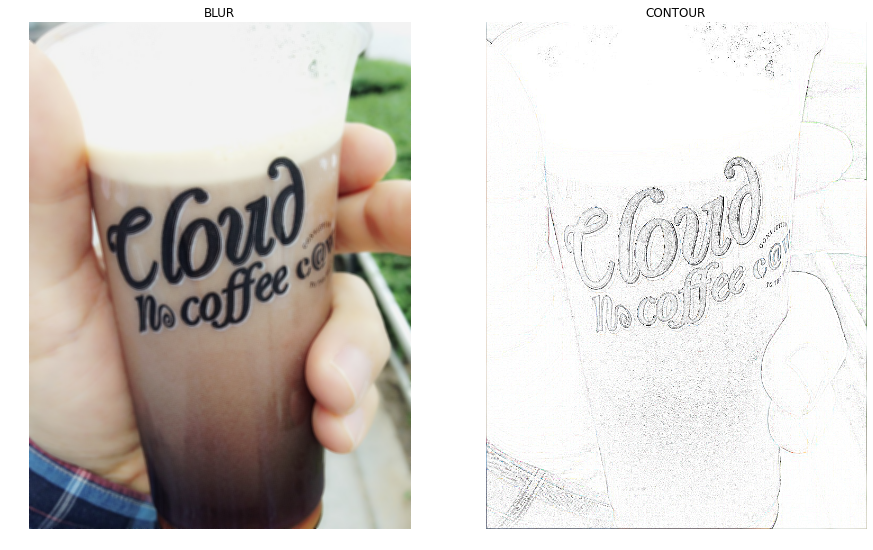

In [127]:
# Applying filters
plt.figure(figsize=(15,12))

im = Image.open("./data/IMG_4135.jpg")
out = im.filter(ImageFilter.BLUR)
plt.subplot(1,2,1)
plt.axis('off')
plt.title('BLUR')
plt.imshow(out)

out = im.filter(ImageFilter.CONTOUR)
plt.subplot(1,2,2)
plt.axis('off')
plt.title('CONTOUR')
plt.imshow(out)

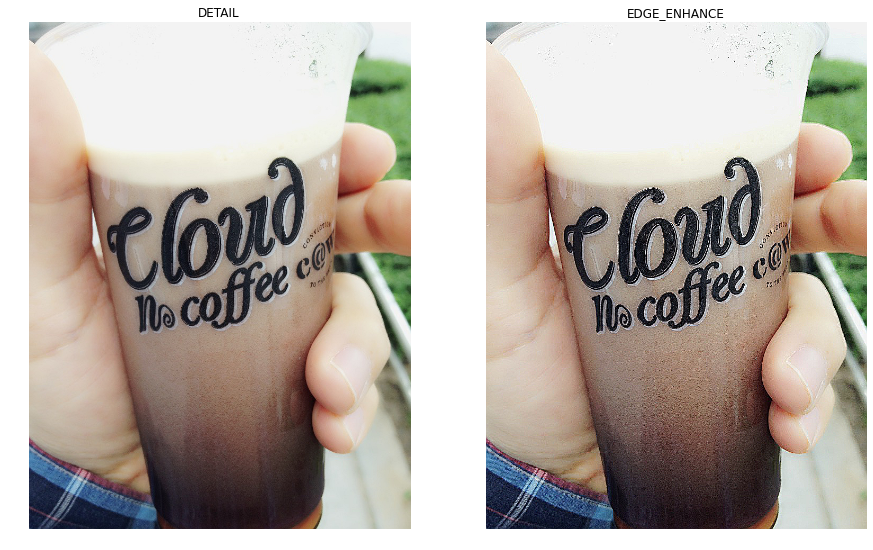

In [126]:
# Applying filters
plt.figure(figsize=(15,12))

im = Image.open("./data/IMG_4135.jpg")
out = im.filter(ImageFilter.DETAIL)
plt.subplot(1,2,1)
plt.axis('off')
plt.title('DETAIL')
plt.imshow(out)

out = im.filter(ImageFilter.EDGE_ENHANCE)
plt.subplot(1,2,2)
plt.axis('off')
plt.title('EDGE_ENHANCE')
plt.imshow(out)

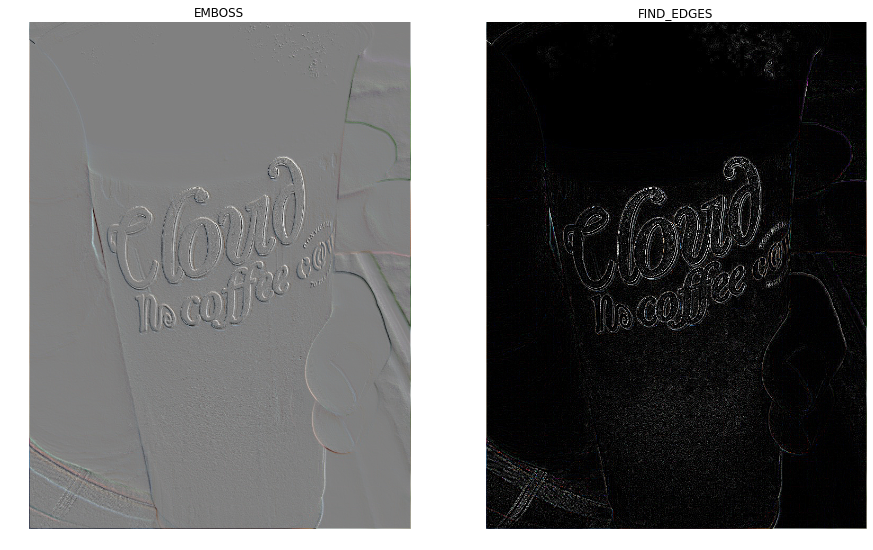

In [131]:
# Applying filters
plt.figure(figsize=(15,12))

im = Image.open("./data/IMG_4135.jpg")
out = im.filter(ImageFilter.EMBOSS)
plt.subplot(1,2,1)
plt.axis('off')
plt.title('EMBOSS')
plt.imshow(out)

out = im.filter(ImageFilter.FIND_EDGES)
plt.subplot(1,2,2)
plt.axis('off')
plt.title('FIND_EDGES')
plt.imshow(out)

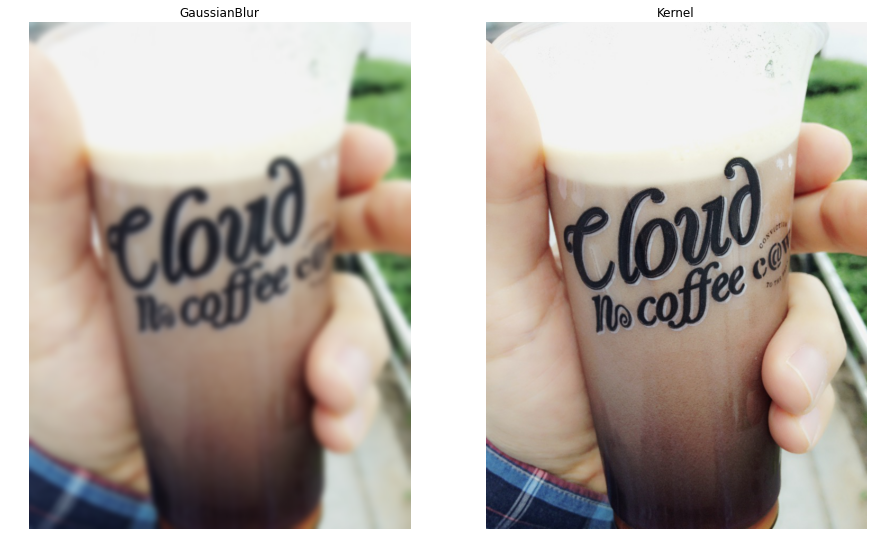

In [132]:
# Applying filters
plt.figure(figsize=(15,12))

im = Image.open("./data/IMG_4135.jpg")
out = im.filter(ImageFilter.GaussianBlur(radius=5))
plt.subplot(1,2,1)
plt.axis('off')
plt.title('GaussianBlur')
plt.imshow(out)

out = im.filter(ImageFilter.Kernel((3, 3), [1, 2, 1, 2, 4, 2, 1, 2, 1], 16))
plt.subplot(1,2,2)
plt.axis('off')
plt.title('Kernel')
plt.imshow(out)

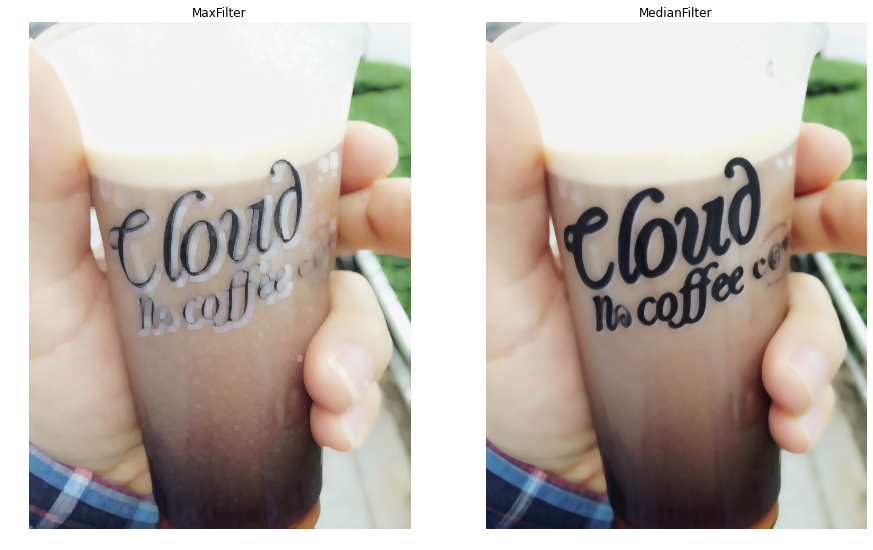

In [136]:
# Applying filters
plt.figure(figsize=(15,12))

im = Image.open("./data/IMG_4135.jpg")
out = im.filter(ImageFilter.MaxFilter(size=9))
plt.subplot(1,2,1)
plt.axis('off')
plt.title('MaxFilter')
plt.imshow(out)

out = im.filter(ImageFilter.MedianFilter(size=9))
plt.subplot(1,2,2)
plt.axis('off')
plt.title('MedianFilter')
plt.imshow(out)

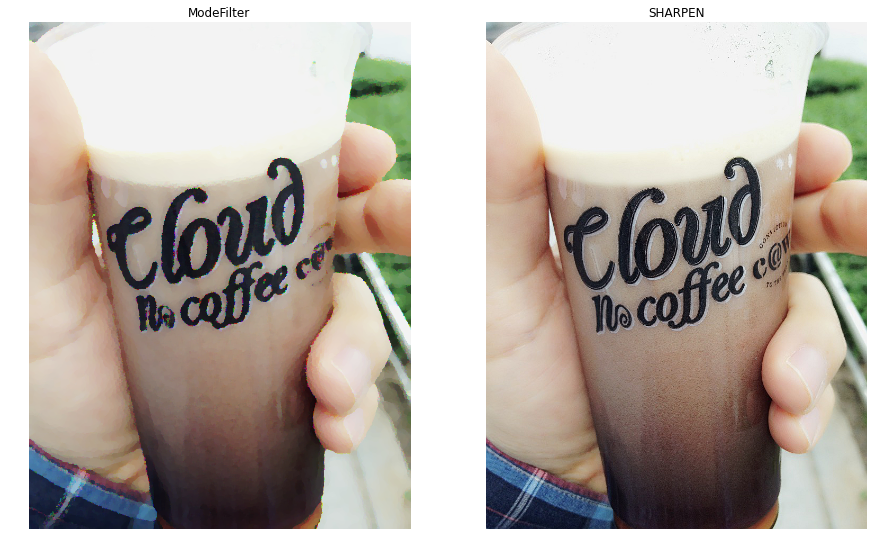

In [137]:
# Applying filters
plt.figure(figsize=(15,12))

im = Image.open("./data/IMG_4135.jpg")
out = im.filter(ImageFilter.ModeFilter(size=9))
plt.subplot(1,2,1)
plt.axis('off')
plt.title('ModeFilter')
plt.imshow(out)

out = im.filter(ImageFilter.SHARPEN)
plt.subplot(1,2,2)
plt.axis('off')
plt.title('SHARPEN')
plt.imshow(out)

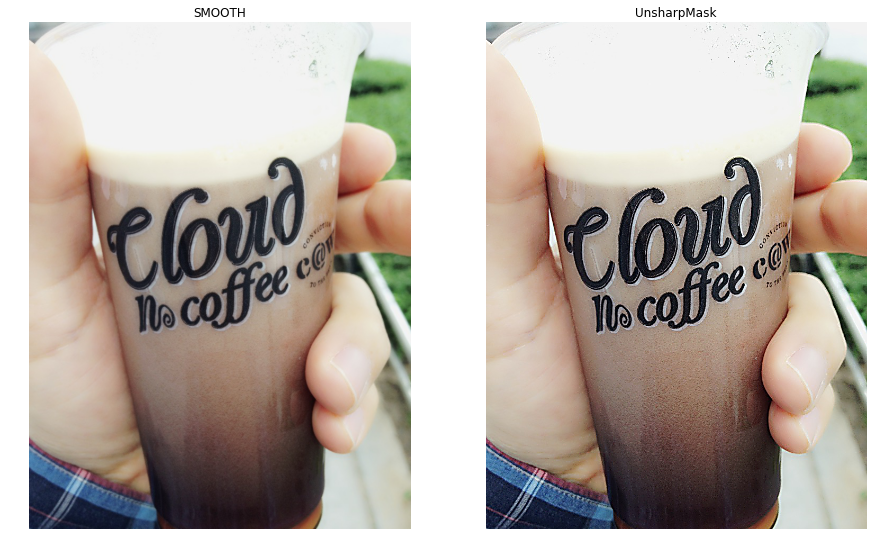

In [138]:
# Applying filters
plt.figure(figsize=(15,12))

im = Image.open("./data/IMG_4135.jpg")
out = im.filter(ImageFilter.SMOOTH)
plt.subplot(1,2,1)
plt.axis('off')
plt.title('SMOOTH')
plt.imshow(out)

out = im.filter(ImageFilter.UnsharpMask)
plt.subplot(1,2,2)
plt.axis('off')
plt.title('UnsharpMask')
plt.imshow(out)

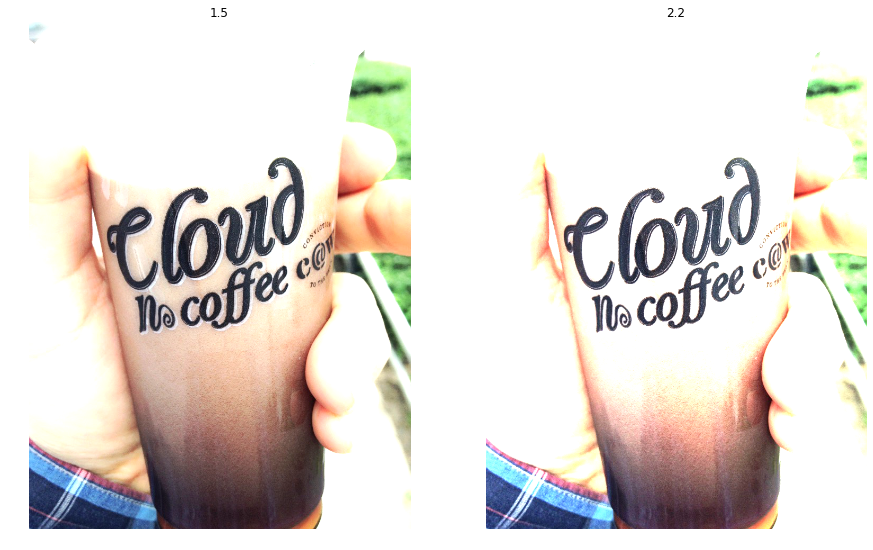

In [139]:
# Applying filters
plt.figure(figsize=(15,12))

im = Image.open("./data/IMG_4135.jpg")
# multiply each pixel by 1.5
out = im.point(lambda i: i * 1.5)
plt.subplot(1,2,1)
plt.axis('off')
plt.title('1.5')
plt.imshow(out)

# multiply each pixel by 2.2
out = im.point(lambda i: i * 2.2)
plt.subplot(1,2,2)
plt.axis('off')
plt.title('2.2')
plt.imshow(out)

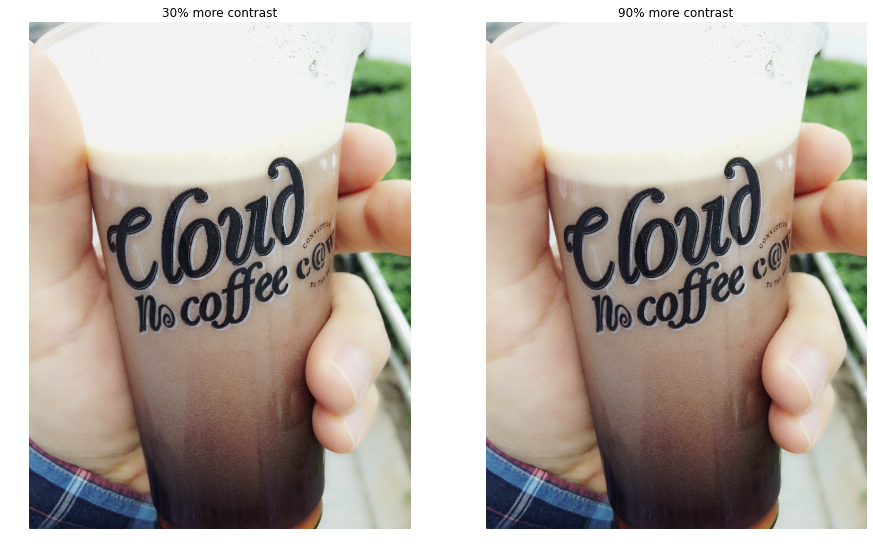

In [143]:
# Applying Contrast
plt.figure(figsize=(15,12))

im = Image.open("./data/IMG_4135.jpg")
# 30% more contrast
enh = ImageEnhance.Contrast(im)
enh.enhance(1.3)
plt.subplot(1,2,1)
plt.axis('off')
plt.title('30% more contrast')
plt.imshow(im)

# 90% more contrast
enh = ImageEnhance.Contrast(im)
enh.enhance(1.9)
plt.subplot(1,2,2)
plt.axis('off')
plt.title('90% more contrast')
plt.imshow(im)

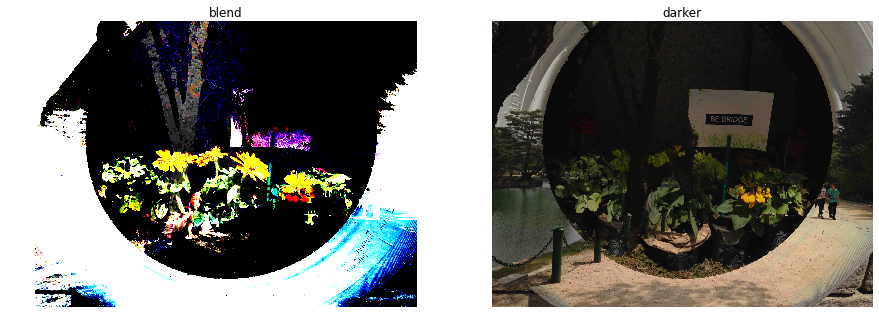

In [155]:
plt.figure(figsize=(15,12))

# 이미지 파일 경로
im1 = "./data/IMG_4139.jpg"
im2 = "./data/IMG_4164.jpg"

# 이미지 파일 로드
img1 = Image.open(im1)
img2 = Image.open(im2)

out1 = Image.blend(img1, img2, 9.3)
plt.subplot(1,2,1)
plt.axis('off')
plt.title('blend')
plt.imshow(out1)

out2 = ImageChops.darker(img1, img2)
plt.subplot(1,2,2)
plt.axis('off')
plt.title('darker')
plt.imshow(out2)

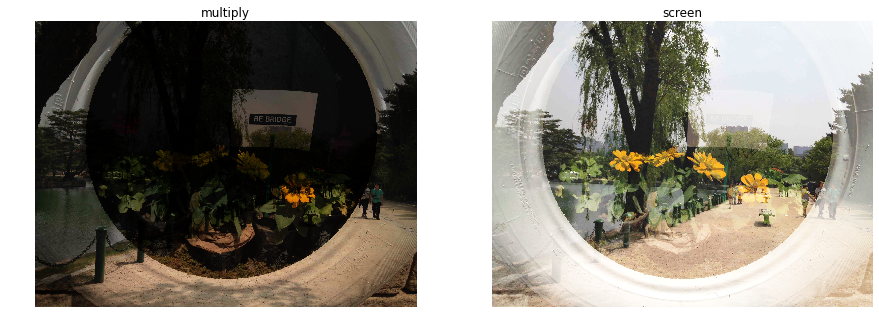

In [156]:
plt.figure(figsize=(15,12))

# 이미지 파일 경로
im1 = "./data/IMG_4139.jpg"
im2 = "./data/IMG_4164.jpg"

# 이미지 파일 로드
im1 = Image.open(im1)
im2 = Image.open(im2)

out1 = ImageChops.multiply(im1, im2)
plt.subplot(1,2,1)
plt.axis('off')
plt.title('multiply')
plt.imshow(out1)

out2 = ImageChops.screen(im1, im2)
plt.subplot(1,2,2)
plt.axis('off')
plt.title('screen')
plt.imshow(out2)

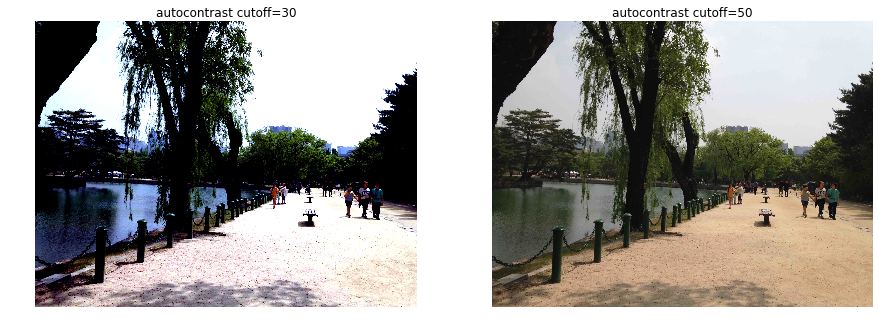

In [165]:
plt.figure(figsize=(15,12))

# 이미지 파일 경로
im1 = "./data/IMG_4139.jpg"
im2 = "./data/IMG_4164.jpg"

# 이미지 파일 로드
im1 = Image.open(im1)
im2 = Image.open(im2)

out1 = ImageOps.autocontrast(im1, cutoff=30)
plt.subplot(1,2,1)
plt.axis('off')
plt.title('autocontrast cutoff=30')
plt.imshow(out1)

out2 = ImageOps.autocontrast(im1, cutoff=50)
plt.subplot(1,2,2)
plt.axis('off')
plt.title('autocontrast cutoff=50')
plt.imshow(out2)

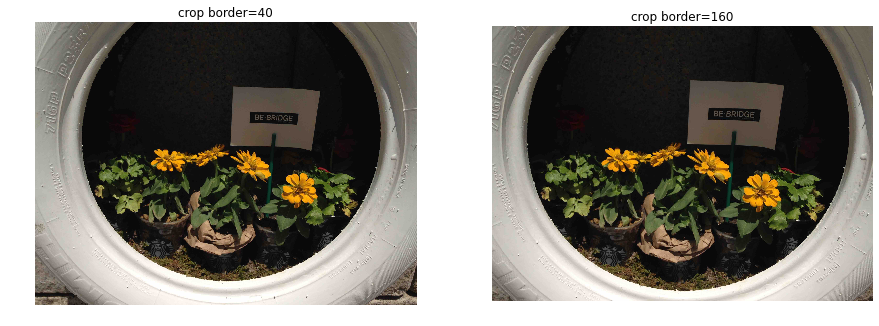

In [164]:
plt.figure(figsize=(15,12))

# 이미지 파일 경로
im1 = "./data/IMG_4139.jpg"
im2 = "./data/IMG_4164.jpg"

# 이미지 파일 로드
im1 = Image.open(im1)
im2 = Image.open(im2)

out1 = ImageOps.crop(im2, border=40)
plt.subplot(1,2,1)
plt.axis('off')
plt.title('crop border=40')
plt.imshow(out1)

out2 = ImageOps.crop(im2, border=160)
plt.subplot(1,2,2)
plt.axis('off')
plt.title('crop border=160')
plt.imshow(out2)

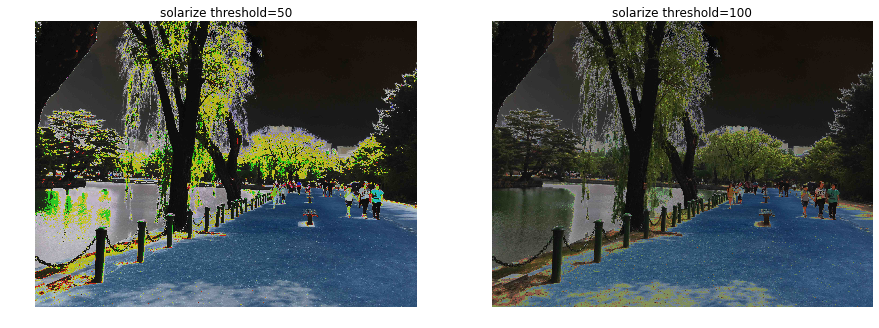

In [162]:
plt.figure(figsize=(15,12))

# 이미지 파일 경로
im1 = "./data/IMG_4139.jpg"
im2 = "./data/IMG_4164.jpg"

# 이미지 파일 로드
im1 = Image.open(im1)
im2 = Image.open(im2)

out1 = ImageOps.solarize(im1, threshold=50)
plt.subplot(1,2,1)
plt.axis('off')
plt.title('solarize threshold=50')
plt.imshow(out1)

out2 = ImageOps.solarize(im1, threshold=100)
plt.subplot(1,2,2)
plt.axis('off')
plt.title('solarize threshold=100')
plt.imshow(out2)

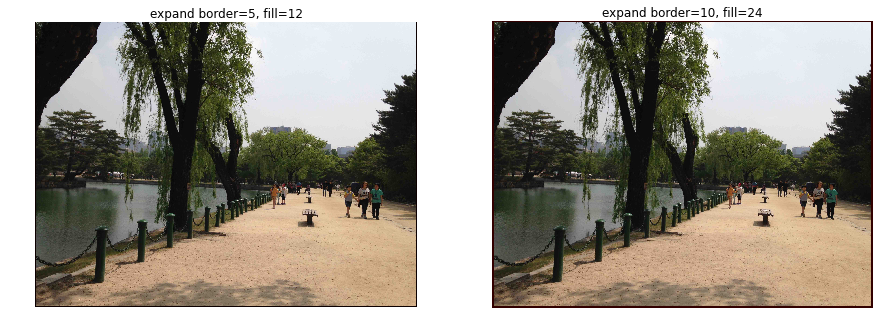

In [169]:
plt.figure(figsize=(15,12))

# 이미지 파일 경로
im1 = "./data/IMG_4139.jpg"
im2 = "./data/IMG_4164.jpg"

# 이미지 파일 로드
im1 = Image.open(im1)
im2 = Image.open(im2)

out1 = ImageOps.expand(im1, border=5, fill=12) 
plt.subplot(1,2,1)
plt.axis('off')
plt.title('expand border=5, fill=12')
plt.imshow(out1)

out2 = ImageOps.expand(im1, border=20, fill=50) 
plt.subplot(1,2,2)
plt.axis('off')
plt.title('expand border=20, fill=50')
plt.imshow(out2)

In [4]:
# 히스토그램 출력하기

# 이미지 파일 경로
im = "./data/IMG_4139.jpg"

# 이미지 파일 로드
im = Image.open(im)

his = im.histogram()

values = {}

for i in range(256):
  values[i] = his[i]

print "The first column is the colour’s id. The second is the number of pixels in the image of that colour."

for j,k in sorted(values.items(), key=itemgetter(1), reverse=True)[:10]:
  print j,k

The first column is the colour’s id. The second is the number of pixels in the image of that colour.
13 430001
231 363448
227 301249
230 225963
16 190139
20 173877
226 136136
23 126087
205 125705
234 118988


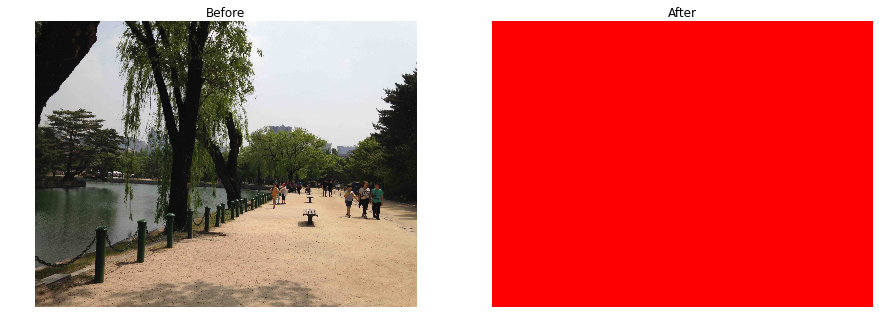

In [14]:
plt.figure(figsize=(15,12))


# 이미지 파일 경로
im = "./data/IMG_4139.jpg"

# 이미지 파일 로드
im = Image.open(im)

im2 = Image.new("RGB", im.size, 255)

temp = {}

for x in range(im.size[1]):
  for y in range(im.size[0]):
    pix = im.getpixel((y,x))
    temp[pix] = pix
    if pix < 25: # these are the numbers to get
      im2.putpixel((y,x),pix)

plt.subplot(111)
plt.axis('off')
plt.title('change pixels')
plt.imshow(im2)

plt.subplot(1,2,1)
plt.axis('off')
plt.title('Before')
plt.imshow(im)

plt.subplot(1,2,2)
plt.axis('off')
plt.title('After')
plt.imshow(im2)